# Тема проекта «Классификация типов переработки на основе текстового описания»

In [1]:
import pandas as pd
import numpy as np
import string
import time

In [2]:
# Подготовка данных 

df = pd.read_excel('data/АВР_Плановые_размеченный файл.xlsx')

In [3]:
df.head()

,Описание переработки,Тип переработки
0,3711629 АП2024 Расширение аренды МГ Сочи - Кра...,Плановые работы
1,Восстановление работоспособности РРЛ Камышева...,АВР
2,Восстановление работоспособности РРЛ Камышева...,АВР
3,TT RMD 43370996\tДГУ_БС 62368 КдК-Крнд-Тихорец...,АВР
4,TT RMD 43370996\tДГУ_БС 62368 КдК-Крнд-Тихорец...,АВР


In [4]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 16883 entries, 0 to 16882
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Описание переработки  16883 non-null  str  
 1   Тип переработки       16883 non-null  str  
dtypes: str(2)
memory usage: 263.9 KB


In [5]:
# функция, которая нормализует слово и убирает знаки пунктуации в любой части слова и заменяет на пробел.


from collections import Counter
import pymorphy3
import string


morph = pymorphy3.MorphAnalyzer()

normalize_cache = {}

non_actual_symbols = {'PREP', 'CONJ', 'NPRO'}

punct_table = str.maketrans({ch: ' ' for ch in string.punctuation})


def normalize_word(word):

    if word in normalize_cache:
        return normalize_cache[word]
    
    word_clean = word.translate(punct_table).lower()

    if not word_clean.strip():
        normalize_cache[word] = None
        return None
    
    parts = word_clean.split()
    results = []

    for part in parts:
        try:
            parsed = morph.parse(part)[0]
            if parsed.tag.POS in non_actual_symbols:
                continue

            results.append(parsed.normal_form)
        except:
            continue
    
    if not results:
        normalize_cache[word] = None
        return None


    if len(results) == 1:
        normalize_cache[word] = results[0]
        return results[0]

    normalize_cache[word] = results
    return results

   

In [6]:

# Перебор всех слов и их нормализация. На выходе получаем список со всеми словами

texts = df['Описание переработки']

all_normalized_words = []

for text in texts:
    for word in text.split():
        norm = normalize_word(word)
        if norm:
            if isinstance(norm, list):
                all_normalized_words.extend(norm)
            else:
                all_normalized_words.append(norm)

print(f"Всего слов: {len(all_normalized_words)}")
all_normalized_words[:20]


Всего слов: 276258


['3711629',
 'ап2024',
 'расширение',
 'аренда',
 'мг',
 'сочи',
 'краснодар',
 '20g',
 'ffm',
 '748413',
 'opl',
 '1744214',
 'восстановление',
 'работоспособность',
 'ррл',
 'камышеватский',
 'ясенский',
 'центр',
 'восстановление',
 'работоспособность']

In [7]:
# Создание словаря частотности слов и забираем Топ слов, которые сами хотим.


word_counts = Counter(all_normalized_words)
top_n = 500
top_words = [word for word, _ in word_counts.most_common(top_n)] #- перебор списка кортежей ключ значение
# print(top_words)
top_words_set = set(top_words) #- перевод в множество, для более быстрой обработки, так как слов много

print(f"Уникальных слов: {len(word_counts)}")
print(f"Используем топ-{top_n} самых частых слов для матрицы")
print(f"Топ-10 слов: {top_words[:10]}\n")

Уникальных слов: 34226
Используем топ-500 самых частых слов для матрицы
Топ-10 слов: ['бс', 'ffm', 'позиция', 'выезд', 'авр', 'работа', 'tt', 'не', 'номер', 'замена']



In [8]:
print("Создаем матрицу слово из выбранных и их кол-во в тексте")

data_for_df = []

for text in df['Описание переработки']:
    if pd.isna(text):
        row_counts = Counter()
    else:
        row_counts = Counter()
        for word in text.split():
            norm = normalize_word(word)
            if not norm:
                continue

            if isinstance(norm, list):
                for elem in norm:
                    if elem in top_words_set:
                        row_counts[elem] += 1
            else:
                if norm in top_words_set:
                    row_counts[norm] += 1
    
    row_dict = {word: row_counts.get(word, 0) for word in top_words}
    data_for_df.append(row_dict)
data_for_df


Создаем матрицу слово из выбранных и их кол-во в тексте


[{'бс': 0,
  'ffm': 1,
  'позиция': 0,
  'выезд': 0,
  'авр': 0,
  'работа': 0,
  'tt': 0,
  'не': 0,
  'номер': 0,
  'замена': 0,
  'восстановление': 0,
  '1': 0,
  'дгу': 0,
  '2': 0,
  'работать': 0,
  'opl': 1,
  'тт': 0,
  'rmd': 0,
  'кдк': 0,
  'бригада': 0,
  'эп': 0,
  'г': 0,
  'отсутствие': 0,
  'ул': 0,
  'всё': 0,
  'ррл': 0,
  'авария': 0,
  '3': 0,
  'далее': 0,
  'питание': 0,
  'бгу': 0,
  'э': 0,
  'п': 0,
  'ttms': 0,
  'устранение': 0,
  'сопровождение': 0,
  'дар': 0,
  'быть': 0,
  'оборудование': 0,
  'н': 0,
  'проблема': 0,
  'ерп': 0,
  'ибп': 0,
  'россия': 0,
  'проверка': 0,
  'автомат': 0,
  'авто': 0,
  'работоспособность': 0,
  'связь': 0,
  '5': 0,
  'х': 0,
  'р': 0,
  'рсо': 0,
  'чр': 0,
  'quot': 0,
  'магомедов': 0,
  'обл': 0,
  'гаджикерим': 0,
  'м': 0,
  'код': 0,
  'плата': 0,
  'nri': 0,
  'линк': 0,
  'установка': 0,
  'инцидент': 0,
  '0': 0,
  'пролёт': 0,
  '4': 0,
  'трафик': 0,
  'восстановить': 0,
  'отключение': 0,
  'генерация': 0,
 

In [9]:
df_words = pd.DataFrame(data_for_df)
df_words

,бс,ffm,позиция,выезд,авр,работа,tt,не,номер,замена,...,failure,08,nvm,яровой,пропадание,отключить,рабочий,vrn,power,возвращение
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,1,1,0,2,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,2,0,0,0,1,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16878,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
16879,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
16880,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
16881,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [10]:
print("Объединение с исходными данными...")
result_df = pd.concat([df, df_words], axis=1)
result_df[:10]

Объединение с исходными данными...


,Описание переработки,Тип переработки,бс,ffm,позиция,выезд,авр,работа,tt,не,...,failure,08,nvm,яровой,пропадание,отключить,рабочий,vrn,power,возвращение
0,3711629 АП2024 Расширение аренды МГ Сочи - Кра...,Плановые работы,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Восстановление работоспособности РРЛ Камышева...,АВР,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Восстановление работоспособности РРЛ Камышева...,АВР,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,TT RMD 43370996\tДГУ_БС 62368 КдК-Крнд-Тихорец...,АВР,3,0,0,1,1,0,2,0,...,0,0,0,0,0,0,0,0,0,0
4,TT RMD 43370996\tДГУ_БС 62368 КдК-Крнд-Тихорец...,АВР,2,0,0,0,1,0,2,0,...,0,0,0,0,0,0,0,0,0,0
5,ДГУ БС 34042 Рыкань,АВР,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,ДГУ БС 34042 Рыкань,АВР,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,Выезд на длительное дизеление (замена сотрудни...,АВР,1,1,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,FFM 731516 ERP 25026061205 АВР выезд TT RMD 40...,АВР,1,1,0,2,2,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,OPL 1896710,Плановые работы,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Визуализация целевого признака


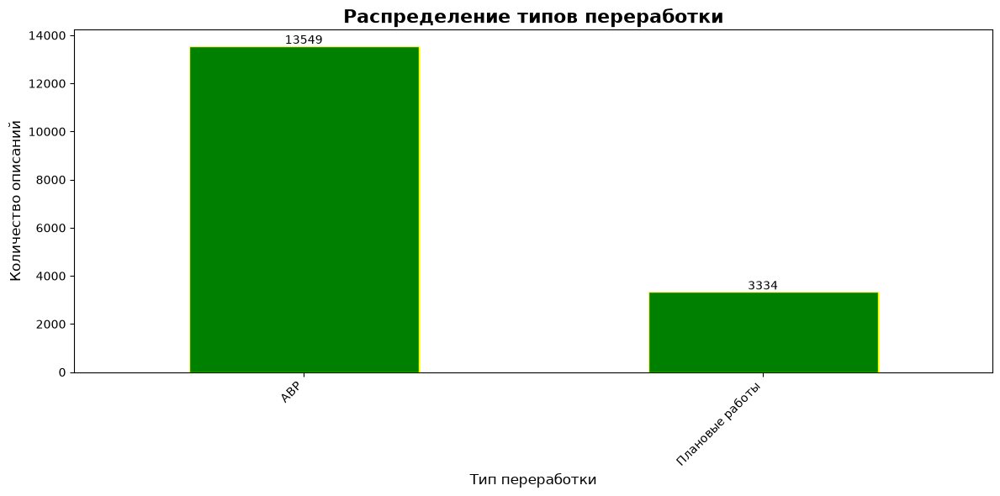

In [11]:
print("Визуализация целевого признака")
import matplotlib.pyplot as plt
import seaborn as sns

target_col = 'Тип переработки'

plt.figure(figsize=(12, 6))
target_counts = df[target_col].value_counts()
ax = target_counts.plot(kind='bar', color='green', edgecolor='yellow')

# Добавляем значения на столбцы
for i, v in enumerate(target_counts.values):
    ax.text(i, v + 100 , str(v), ha='center', fontsize=10)

plt.title('Распределение типов переработки', fontsize=16, fontweight='bold')
plt.xlabel('Тип переработки', fontsize=12)
plt.ylabel('Количество описаний', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Визуализация самых популярных слов


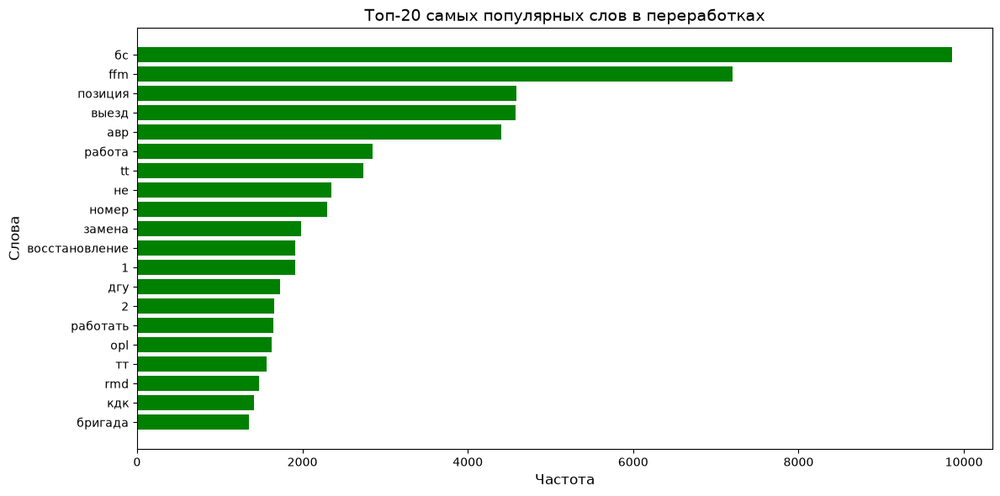

In [12]:
print("Визуализация самых популярных слов")

most_common_words = word_counts.most_common(20)

plt.figure(figsize=(12, 6))
words, counts = zip(*most_common_words)
plt.barh(words, counts, color='green')
plt.xlabel('Частота', fontsize=12)
plt.ylabel('Слова', fontsize=12)
plt.title('Топ-20 самых популярных слов в переработках', fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

Тепловая карты самых популярных слов


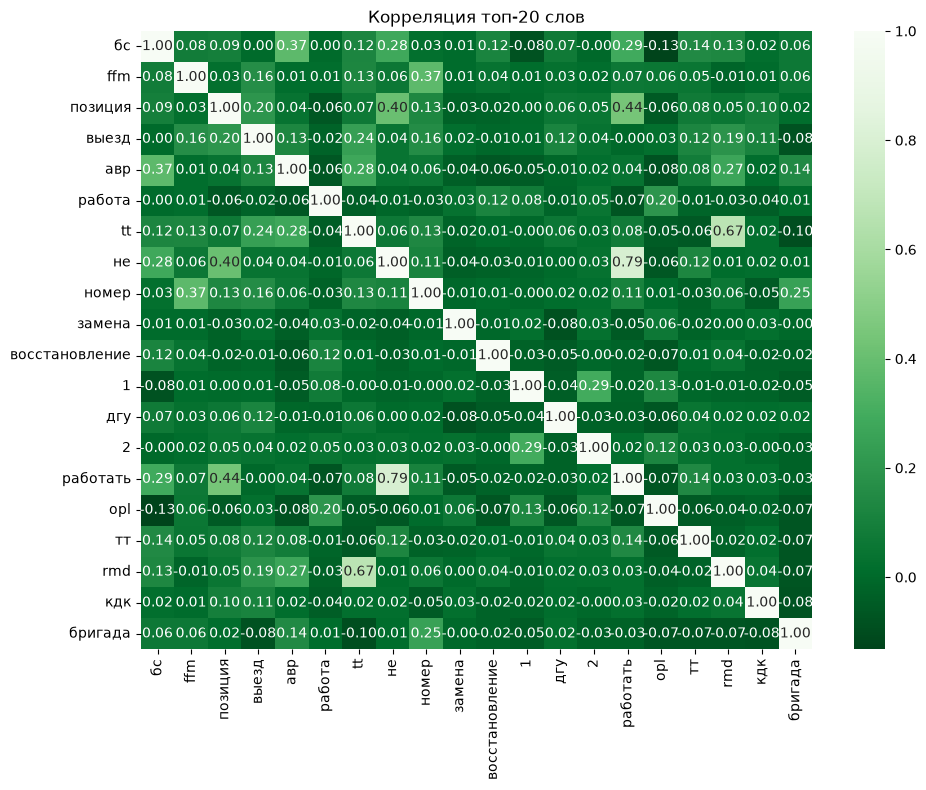

In [13]:
print("Тепловая карты самых популярных слов")
import seaborn as sns
import matplotlib.pyplot as plt

top_20 = top_words[:20]

plt.figure(figsize=(10, 8))
sns.heatmap(df_words[top_20].corr(), annot=True, fmt='.2f', cmap='Greens_r', 
            xticklabels=top_20, yticklabels=top_20)
plt.title('Корреляция топ-20 слов')
plt.tight_layout()
plt.show()

Отчет о классификации
                 precision    recall  f1-score   support

            АВР       0.96      0.97      0.97      4065
Плановые работы       0.89      0.82      0.85      1000

       accuracy                           0.94      5065
      macro avg       0.92      0.90      0.91      5065
   weighted avg       0.94      0.94      0.94      5065

ROC-AUC: 0.9746


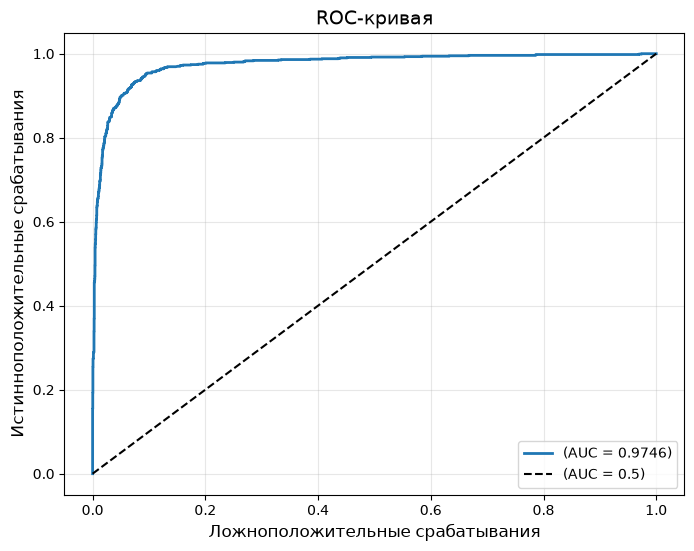

In [14]:
# Для старта возьмем логистическую регрессию для классификации, потому что она быстрая, интерпретируемая и хороша для старта перед сложными моделями

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, roc_curve
from sklearn.preprocessing import LabelEncoder


y = result_df['Тип переработки']
X = result_df.iloc[:, 2:]

encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)        

X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
)

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]

print("Отчет о классификации")
print(classification_report(y_test, y_pred, target_names=encoder.classes_))

roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC-AUC: {roc_auc:.4f}")

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'(AUC = {roc_auc:.4f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'k--', label='(AUC = 0.5)')
plt.xlabel('Ложноположительные срабатывания', fontsize=12)
plt.ylabel('Истинноположительные срабатывания', fontsize=12)
plt.title('ROC-кривая', fontsize=14)
plt.legend(loc='lower right')
plt.grid(True, alpha=0.3)
plt.show()

In [15]:
# Проверка логистической регрессии на разном количестве слов
print("Проверка логистической регрессии на разном количестве слов")

results_lr = []

for n_words in [100, 200, 500, 1000, 2000, 5000]:
    start_time = time.time()
    
    top_n_words = [word for word, _ in word_counts.most_common(n_words)]
    top_n_set = set(top_n_words)
    
    data = []
    for text in df['Описание переработки']:
        counts = Counter()
        if pd.notna(text):
            for word in text.split():
                norm = normalize_word(word)
                if norm:
                    words = norm if isinstance(norm, list) else [norm]
                    for w in words:
                        if w in top_n_set:
                            counts[w] += 1
        data.append({w: counts.get(w, 0) for w in top_n_words})
    
    X = pd.DataFrame(data)
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
    )
    
    model = LogisticRegression(max_iter=1000, random_state=42)
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    accuracy = (y_pred == y_test).mean()
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    train_time = time.time() - start_time
    
    results_lr.append({
        'Количество слов': n_words,
        'Время обучения (сек)': round(train_time, 3),
        'Accuracy': round(accuracy, 4),
        'ROC-AUC': round(roc_auc, 4)
    })
    
    print(f"Слов: {n_words:>4} | Время: {train_time:.3f}с | Accuracy: {accuracy:.4f} | ROC-AUC: {roc_auc:.4f}")

Проверка логистической регрессии на разном количестве слов
Слов:  100 | Время: 0.749с | Accuracy: 0.9242 | ROC-AUC: 0.9597
Слов:  200 | Время: 1.154с | Accuracy: 0.9372 | ROC-AUC: 0.9699
Слов:  500 | Время: 2.806с | Accuracy: 0.9439 | ROC-AUC: 0.9746
Слов: 1000 | Время: 5.137с | Accuracy: 0.9510 | ROC-AUC: 0.9776
Слов: 2000 | Время: 10.649с | Accuracy: 0.9534 | ROC-AUC: 0.9807
Слов: 5000 | Время: 27.807с | Accuracy: 0.9574 | ROC-AUC: 0.9829


In [18]:
'''
Оставляем 500 слов, так дальше растет время, но ROC-AUC изменяется незначительно. 

'''

n_words = 500

top_n_words = [word for word, _ in word_counts.most_common(n_words)]
top_n_set = set(top_n_words)

data = []
for text in df['Описание переработки']:
    counts = Counter()
    if pd.notna(text):
        for word in text.split():
            norm = normalize_word(word)
            if norm:
                words = norm if isinstance(norm, list) else [norm]
                for w in words:
                    if w in top_n_set:
                        counts[w] += 1
    data.append({w: counts.get(w, 0) for w in top_n_words})

X = pd.DataFrame(data)

X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.3, random_state=42, stratify=y_encoded
)



In [22]:
# Подбор гиперпараметров

from sklearn.model_selection import GridSearchCV
import warnings


warnings.filterwarnings('ignore') 

print("Подбор гиперпараметров (GridSearchCV)")

param_grid = {
    'C': [0.01, 0.1, 1.0, 10.0, 100.0],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

grid = GridSearchCV(
    LogisticRegression(max_iter=1000, random_state=42),
    param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

grid.fit(X_train, y_train)

print(f"Лучшие параметры: {grid.best_params_}")

best_model = grid.best_estimator_

y_pred_best = best_model.predict(X_test)
y_pred_proba_best = best_model.predict_proba(X_test)[:, 1]


print("Модель после Gridsearch")
print(classification_report(y_test, y_pred_best, target_names=encoder.classes_))

roc_auc_best = roc_auc_score(y_test, y_pred_proba_best)
print(f"ROC-AUC: {roc_auc_best:.4f}")

Подбор гиперпараметров (GridSearchCV)
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Лучшие параметры: {'C': 1.0, 'penalty': 'l2', 'solver': 'saga'}
Модель после Gridsearch
                 precision    recall  f1-score   support

            АВР       0.96      0.97      0.97      4065
Плановые работы       0.89      0.82      0.85      1000

       accuracy                           0.94      5065
      macro avg       0.92      0.90      0.91      5065
   weighted avg       0.94      0.94      0.94      5065

ROC-AUC: 0.9746


In [23]:
#Тестируем RandomForest

from sklearn.ensemble import RandomForestClassifier


rf = RandomForestClassifier(
    n_estimators=100,      
    max_depth=10,          
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)


y_pred_rf = rf.predict(X_test)
y_pred_proba_rf = rf.predict_proba(X_test)[:, 1]



print("RandomForest")
print(classification_report(y_test, y_pred_rf, target_names=encoder.classes_))
print(f"ROC-AUC: {roc_auc_score(y_test, y_pred_proba_rf):.4f}")

RandomForest
                 precision    recall  f1-score   support

            АВР       0.89      1.00      0.94      4065
Плановые работы       0.97      0.48      0.64      1000

       accuracy                           0.89      5065
      macro avg       0.93      0.74      0.79      5065
   weighted avg       0.90      0.89      0.88      5065

ROC-AUC: 0.9662


In [24]:
# Тестируем xgboost
from xgboost import XGBClassifier
import warnings


warnings.filterwarnings('ignore') 

xgb = XGBClassifier(
    n_estimators=100,
    max_depth=6,
    learning_rate=0.1,
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss'
)

xgb.fit(X_train, y_train)


y_pred_xgb = xgb.predict(X_test)
y_pred_proba_xgb = xgb.predict_proba(X_test)[:, 1]



print("XGboost")
print(classification_report(y_test, y_pred_xgb, target_names=encoder.classes_))
print(f"ROC-AUC: {roc_auc_score(y_test, y_pred_proba_xgb):.4f}")

XGboost
                 precision    recall  f1-score   support

            АВР       0.95      0.98      0.96      4065
Плановые работы       0.91      0.78      0.84      1000

       accuracy                           0.94      5065
      macro avg       0.93      0.88      0.90      5065
   weighted avg       0.94      0.94      0.94      5065

ROC-AUC: 0.9772


In [25]:
# Собираем результаты всех моделей
results = []

models = [
    ('Logistic Regression', y_pred_best, y_pred_proba_best),
    ('Random Forest', y_pred_rf, y_pred_proba_rf),
    ('XGBoost', y_pred_xgb, y_pred_proba_xgb)
]

for name, pred, proba in models:
    report = classification_report(y_test, pred, output_dict=True, target_names=encoder.classes_)
    
    results.append({
        'Модель': name,
        'F1 (АВР)': report['АВР']['f1-score'],
        'F1 (Плановые)': report['Плановые работы']['f1-score'],
        'F1-macro': report['macro avg']['f1-score'],
        'Accuracy': report['accuracy'],
        'ROC-AUC': roc_auc_score(y_test, proba)
    })


comparison_df = pd.DataFrame(results)
print("Сравнение моделей:\n")
print(comparison_df.to_string(index=False))



Сравнение моделей:

             Модель  F1 (АВР)  F1 (Плановые)  F1-macro  Accuracy  ROC-AUC
Logistic Regression  0.965173       0.850886  0.908030  0.943534 0.974624
      Random Forest  0.937854       0.639355  0.788605  0.893978 0.966198
            XGBoost  0.964368       0.840627  0.902497  0.941757 0.977201


In [27]:
# Gridsearch для XGBoost

from sklearn.model_selection import GridSearchCV

print("Подбор параметров для XGBoost")
param_grid = {
    'n_estimators': [50, 100, 200],      
    'max_depth': [3, 6, 9],              
    'learning_rate': [0.05, 0.1, 0.2],   
    'subsample': [0.8, 1.0],             
    'colsample_bytree': [0.8, 1.0]       
}



grid_xgb = GridSearchCV(
    XGBClassifier(
        random_state=42,
        use_label_encoder=False,
        eval_metric='logloss',
        n_jobs=-1
    ),
    param_grid,
    cv=3,                      
    scoring='roc_auc',         
    n_jobs=-1,                 
    verbose=1                  
)


grid_xgb.fit(X_train, y_train)

print("Лучшие параметры")


print(f"n_estimators:     {grid_xgb.best_params_['n_estimators']}")
print(f"max_depth:        {grid_xgb.best_params_['max_depth']}")
print(f"learning_rate:    {grid_xgb.best_params_['learning_rate']}")
print(f"subsample:        {grid_xgb.best_params_['subsample']}")
print(f"colsample_bytree: {grid_xgb.best_params_['colsample_bytree']}")
print(f"\nROC-AUC (CV): {grid_xgb.best_score_:.4f}")


best_xgb = grid_xgb.best_estimator_


y_pred_best = best_xgb.predict(X_test)
y_pred_proba_best = best_xgb.predict_proba(X_test)[:, 1]


base_roc_auc = roc_auc_score(y_test, y_pred_proba_xgb)      
best_roc_auc = roc_auc_score(y_test, y_pred_proba_best)

print("Метрики XGBoost после подбора параметров")
print(classification_report(y_test, y_pred_best, target_names=encoder.classes_))
print(f"ROC-AUC: {best_roc_auc:.4f}")


Подбор параметров для XGBoost
Fitting 3 folds for each of 108 candidates, totalling 324 fits
Лучшие параметры
n_estimators:     200
max_depth:        9
learning_rate:    0.1
subsample:        1.0
colsample_bytree: 0.8

ROC-AUC (CV): 0.9825
Метрики XGBoost после подбора параметров
                 precision    recall  f1-score   support

            АВР       0.96      0.98      0.97      4065
Плановые работы       0.91      0.85      0.88      1000

       accuracy                           0.95      5065
      macro avg       0.94      0.92      0.93      5065
   weighted avg       0.95      0.95      0.95      5065

ROC-AUC: 0.9821


In [28]:
#Сравнение лучших моделей

print(f"Базовая XGBoost:        ROC-AUC = {base_roc_auc:.4f}")
print(f"XGBoost + GridSearch:   ROC-AUC = {best_roc_auc:.4f}")
print(f"Улучшение:              {best_roc_auc - base_roc_auc:.4f}")
print(f"Логистическая регрессия + GridSearch: ROC-AUC: {roc_auc_best:.4f}")
print(f"Улучшение XGBoost vs Логистическая регрессия :  {best_roc_auc - roc_auc_best:.4f}")


Базовая XGBoost:        ROC-AUC = 0.9772
XGBoost + GridSearch:   ROC-AUC = 0.9821
Улучшение:              0.0049
Логистическая регрессия + GridSearch: ROC-AUC: 0.9746
Улучшение XGBoost vs Логистическая регрессия :  0.0075


# Вывод
Выбираем логистическую регрессию!

Разница в ROC-AUC между XGBoost и логистической регрессией всего 0.0075 (незначительно значение).
Обе модели показывают практически одинаковую предсказательную способность. 
Выбираем логистическую регрессию, так как она значительно проще для интерпретации — коэффициенты модели напрямую показывают влияние каждого признака на вероятность целевого события.
Логистическая регрессия требует меньше вычислительных ресурсов, обучается быстрее и менее склонна к переобучению. 
XGBoost, несмотря на свою сложность и мощные возможности по определению нелинейных зависимостей, в данном случае не дает существенного преимущества. 


In [ ]:
# Делаем функцию, в которую можно загрузить данные в исходном формате и получить столбец с типом переработки. 

from datetime import datetime

def predict_new_data(file_path, model, encoder, top_words, top_words_set):
    df = pd.read_excel(file_path, header=1)

    data = []
    for text in df['Описание работ']:
        counts = Counter()
        if pd.notna(text):
            for word in text.split():
                norm = normalize_word(word)
                if norm:
                    words = norm if isinstance(norm, list) else [norm]
                    for w in words:
                        if w in top_words_set:
                            counts[w] += 1
        data.append({w: counts.get(w, 0) for w in top_words})
    
    X = pd.DataFrame(data)
    
    
    df['Тип переработки'] = encoder.inverse_transform(model.predict(X))
    df['Вероятность_АВР'] = model.predict_proba(X)[:, 1]
    
    now = datetime.now().strftime('%Y%m%d_%H%M%S')
    output = file_path.replace('.xlsx', f'_результат_{now}.xlsx')
    df.to_excel(output, index=False)
    print(f"Сохранено: {output}")
    print(df['Тип переработки'].value_counts())
    
    return df

In [ ]:
df_result = predict_new_data(
    'data/Детальная выгрузка 28.06.xlsx', 
    best_model,      
    encoder,         
    top_words,       
    top_words_set    
)

Сохранено: data\Детальная выгрузка 28.06_результат_20260628_160427.xlsx


KeyError: 'Предсказанный_тип'

Получил рабочий инструмент для разбивки переработок на плановые и аварийные и дальнейшей защиты и корректировки бюджета. 